In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import plotly.io as pio
import plotly.express as px

## Free memory
import gc

# datos abiertos
import requests
from sodapy import Socrata

# train_test_split to train and test
from sklearn.model_selection import train_test_split

# Import LabelEncoder
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

# MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

# Metrics
from sklearn import metrics

# KNN
from sklearn.neighbors import KNeighborsClassifier

# DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_graphviz
from sklearn.tree import export_text
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn import tree

# KNN
from sklearn.neighbors import KNeighborsClassifier

## Random Forest
from sklearn.ensemble import RandomForestClassifier

## Support vector machine
from sklearn.svm import SVC

## hide warnings
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)


# To save model
#import joblib
import sklearn.externals
import joblib

## Extrac data

In [2]:

## https://www.datos.gov.co/Inclusi-n-Social-y-Reconciliaci-n/Situaci-n-V-ctimas-Minas-Antipersonal-en-Colombia/yhxn-eqqw

client = Socrata("www.datos.gov.co", None)
results = client.get("yhxn-eqqw", limit=10000000)

df = pd.DataFrame.from_records(results)

In [3]:
del results
gc.collect()

16

In [4]:
df.head()

,departamento,codigodanedepartamento,municipio,codigodanemunicipio,tipoarea,sitio,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,latitudcabecera,longitudcabecera,tipoevento,ubicaci_n,actividad
0,ANTIOQUIA,5,GRANADA,5313,Rural,Sin información,2006,1,Mayor de 18 años,No,Civil,Herido,Hombre,6.143703,-75.185183,Sin informacion,"{'latitude': '6.143703', 'longitude': '-75.185...","Pasando, estando cerca"
1,CAQUETA,18,MONTAÑITA,18410,Rural,Sin información,2009,12,Mayor de 18 años,No,Civil,Herido,Hombre,1.49494421255,-75.4630895064,Sin informacion,"{'latitude': '1.49494421255', 'longitude': '-7...",Erradicador manual - PCI
2,PUTUMAYO,86,PUERTO ASÍS,86568,Rural,Sin información,2008,4,Mayor de 18 años,No,Civil,Muerto,Hombre,0.502569,-76.49818,Sin informacion,"{'latitude': '0.502569', 'longitude': '-76.498...",Erradicador manual - PCI
3,CORDOBA,23,PUERTO LIBERTADOR,23580,Rural,Sin información,2009,11,Mayor de 18 años,No,Civil,Herido,Hombre,7.883545,-75.670508,Sin informacion,"{'latitude': '7.883545', 'longitude': '-75.670...",Erradicador manual - PCI
4,CORDOBA,23,PUERTO LIBERTADOR,23580,Rural,Sin información,2009,11,Mayor de 18 años,No,Civil,Herido,Hombre,7.883545,-75.670508,Sin informacion,"{'latitude': '7.883545', 'longitude': '-75.670...",Erradicador manual - PCI


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12273 entries, 0 to 12272
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   departamento            12273 non-null  object
 1   codigodanedepartamento  12273 non-null  object
 2   municipio               12273 non-null  object
 3   codigodanemunicipio     12273 non-null  object
 4   tipoarea                12273 non-null  object
 5   sitio                   12273 non-null  object
 6   ano                     12273 non-null  object
 7   mes                     12273 non-null  object
 8   rangoedad               12273 non-null  object
 9   grupoetnico             12273 non-null  object
 10  condicion               12273 non-null  object
 11  estado                  12273 non-null  object
 12  genero                  12273 non-null  object
 13  latitudcabecera         12273 non-null  object
 14  longitudcabecera        12273 non-null  object
 15  ti

## Clean Data

Delete the columns that not need

In [6]:
#df = df.drop(columns=['sitio','latitudcabecera','longitudcabecera','tipoevento','ubicaci_n'])

df.drop(columns=['sitio','latitudcabecera','longitudcabecera','tipoevento','ubicaci_n'], axis=1, inplace=True)

df.head()

,departamento,codigodanedepartamento,municipio,codigodanemunicipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,actividad
0,ANTIOQUIA,5,GRANADA,5313,Rural,2006,1,Mayor de 18 años,No,Civil,Herido,Hombre,"Pasando, estando cerca"
1,CAQUETA,18,MONTAÑITA,18410,Rural,2009,12,Mayor de 18 años,No,Civil,Herido,Hombre,Erradicador manual - PCI
2,PUTUMAYO,86,PUERTO ASÍS,86568,Rural,2008,4,Mayor de 18 años,No,Civil,Muerto,Hombre,Erradicador manual - PCI
3,CORDOBA,23,PUERTO LIBERTADOR,23580,Rural,2009,11,Mayor de 18 años,No,Civil,Herido,Hombre,Erradicador manual - PCI
4,CORDOBA,23,PUERTO LIBERTADOR,23580,Rural,2009,11,Mayor de 18 años,No,Civil,Herido,Hombre,Erradicador manual - PCI


In [7]:
# Add column with count

df['cantidad'] = 1

In [8]:
df['cantidad'].sum()

12273

Verify the information in all columns and clean

In [9]:
df['tipoarea'].unique()

array(['Rural', 'Urbana'], dtype=object)

In [10]:
df['ano'].unique()

array(['2006', '2009', '2008', '2010', '1993', '2000', '2003', '2004',
       '2007', '2005', '2001', '2011', '1996', '2002', '1999', '1998',
       '1994', '1992', '1997', '1991', '1995', '1990', '2015', '2013',
       '2012', '2014', '2016', '2017', '2018', '2019', '2020', '2021',
       '2022', '1984'], dtype=object)

In [11]:
df['ano'] = df['ano'].astype(int)

In [12]:
df['mes'].unique()

array(['1', '12', '4', '11', '3', '8', '7', '10', '9', '2', '5', '6'],
      dtype=object)

In [13]:
df['mes'] = df['mes'].astype(int)

In [14]:
df['rangoedad'].unique()

array(['Mayor de 18 años', 'Menor de 18 años'], dtype=object)

In [15]:
df['grupoetnico'].unique()

array(['No', 'Indigena', 'Afrodescendiente'], dtype=object)

In [16]:
df['grupoetnico'].replace(
    to_replace=['No'],
    value='Ninguno',
    inplace=True
)

In [17]:
df['condicion'].unique()

array(['Civil', 'Fuerza pública'], dtype=object)

In [18]:
df['estado'].unique()

array(['Herido', 'Muerto'], dtype=object)

In [19]:
df['genero'].unique()

array(['Hombre', 'Mujer', 'Sin Información'], dtype=object)

In [20]:
df = df[df['genero'] != 'Sin Información'].reset_index(drop=True)

In [21]:
df['actividad'].unique()

array(['Pasando, estando cerca', 'Erradicador manual - PCI',
       'Fuerza pública', 'Sin Información', 'Transito por via usual',
       'Cuidado de animales', 'Trabajos de casa',
       'Transito por trocha atajo', 'Otra', 'Agricultura',
       'Recogiendo comida, agua ó  madera',
       'Erradicacion de cultivos ilicitos', 'Jugando', 'Caza, pesca',
       'Viajando', 'Manipulación', 'Labores de desminado',
       'Mantenimiento de infraestructura', 'Actividades fuerza pública',
       'Labores de rescate', 'Erradicación - PONAL'], dtype=object)

In [22]:
# df['actividad'].replace(
#     to_replace=['Erradicador manual - PCI'],
#     value='Erradicador',
#     inplace=True
# )

# df['actividad'].replace(
#     to_replace=['Erradicacion de cultivos ilicitos'],
#     value='Erradicador',
#     inplace=True
# )

# df['actividad'].replace(
#     to_replace=['Erradicación - PONAL'],
#     value='Erradicador',
#     inplace=True
# )

# df['actividad'].replace(
#     to_replace=['Actividades fuerza pública'],
#     value='Fuerza pública',
#     inplace=True
# )

In [23]:
df['codigodanemunicipio'][1903]

'44420'

In [24]:
### Divipola correction

df['codigodanemunicipio'] = df['codigodanemunicipio'].astype(int)


divipola_number = []

for i in range(len(df.index)):

  if df['codigodanemunicipio'][i] <= 9999:
    number_to_string = '0' + str(df['codigodanemunicipio'][i])
    divipola_number.append(number_to_string)

  else:
    number_to_string = str(df['codigodanemunicipio'][i])
    divipola_number.append(number_to_string)

df['divipola'] = divipola_number

df.head()

,departamento,codigodanedepartamento,municipio,codigodanemunicipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,actividad,cantidad,divipola
0,ANTIOQUIA,5,GRANADA,5313,Rural,2006,1,Mayor de 18 años,Ninguno,Civil,Herido,Hombre,"Pasando, estando cerca",1,05313
1,CAQUETA,18,MONTAÑITA,18410,Rural,2009,12,Mayor de 18 años,Ninguno,Civil,Herido,Hombre,Erradicador manual - PCI,1,18410
2,PUTUMAYO,86,PUERTO ASÍS,86568,Rural,2008,4,Mayor de 18 años,Ninguno,Civil,Muerto,Hombre,Erradicador manual - PCI,1,86568
3,CORDOBA,23,PUERTO LIBERTADOR,23580,Rural,2009,11,Mayor de 18 años,Ninguno,Civil,Herido,Hombre,Erradicador manual - PCI,1,23580
4,CORDOBA,23,PUERTO LIBERTADOR,23580,Rural,2009,11,Mayor de 18 años,Ninguno,Civil,Herido,Hombre,Erradicador manual - PCI,1,23580


In [25]:
df = df.drop(columns=['departamento', 'codigodanedepartamento', 'municipio', 'codigodanemunicipio','actividad'])

In [26]:
# Divipola

divipola = pd.read_excel('/Users/andresmauriciotrianareina/Documents/Desarrollos/20_practice_machine_learning/10_excercise/Divipola.xlsx')
divipola = divipola.drop(columns=['DP'])
divipola.head()

,DPNOM,divipola,MPIO
0,Antioquia,5001,Medellín
1,Antioquia,5002,Abejorral
2,Antioquia,5004,Abriaquí
3,Antioquia,5021,Alejandría
4,Antioquia,5030,Amagá


In [27]:
divipola_number = []

divipola['divipola'] = divipola['divipola'].astype(int)

for i in range(len(divipola.index)):

  if divipola['divipola'][i] <= 9999:

    number_to_string = '0' + str(divipola['divipola'][i])
    divipola_number.append(number_to_string)

  else:

    number_to_string = str(divipola['divipola'][i])
    divipola_number.append(number_to_string)

divipola['divipola'] = divipola_number

divipola.head()

,DPNOM,divipola,MPIO
0,Antioquia,05001,Medellín
1,Antioquia,05002,Abejorral
2,Antioquia,05004,Abriaquí
3,Antioquia,05021,Alejandría
4,Antioquia,05030,Amagá


In [28]:
divipola = divipola.rename(columns={'DPNOM':'departamento',
                                   'MPIO':'municipio'})

divipola.columns

Index(['departamento', 'divipola', 'municipio'], dtype='object')

In [29]:
df = pd.merge(df, divipola, on=['divipola'], how='left')
df.head()

,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,cantidad,divipola,departamento,municipio
0,Rural,2006,1,Mayor de 18 años,Ninguno,Civil,Herido,Hombre,1,05313,Antioquia,Granada
1,Rural,2009,12,Mayor de 18 años,Ninguno,Civil,Herido,Hombre,1,18410,Caquetá,La Montañita
2,Rural,2008,4,Mayor de 18 años,Ninguno,Civil,Muerto,Hombre,1,86568,Putumayo,Puerto Asís
3,Rural,2009,11,Mayor de 18 años,Ninguno,Civil,Herido,Hombre,1,23580,Córdoba,Puerto Libertador
4,Rural,2009,11,Mayor de 18 años,Ninguno,Civil,Herido,Hombre,1,23580,Córdoba,Puerto Libertador


In [30]:
df = df.groupby(['departamento','divipola','municipio','tipoarea','ano','mes','rangoedad','grupoetnico','condicion','estado','genero'], as_index=False ,dropna=False).sum()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7079 entries, 0 to 7078
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   departamento  7079 non-null   object
 1   divipola      7079 non-null   object
 2   municipio     7079 non-null   object
 3   tipoarea      7079 non-null   object
 4   ano           7079 non-null   int64 
 5   mes           7079 non-null   int64 
 6   rangoedad     7079 non-null   object
 7   grupoetnico   7079 non-null   object
 8   condicion     7079 non-null   object
 9   estado        7079 non-null   object
 10  genero        7079 non-null   object
 11  cantidad      7079 non-null   int64 
dtypes: int64(3), object(9)
memory usage: 663.8+ KB


In [31]:
df.head()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,cantidad
0,Amazonas,91669,Puerto Santander (CD),Rural,2014,3,Mayor de 18 años,Ninguno,Civil,Herido,Mujer,1
1,Amazonas,91669,Puerto Santander (CD),Rural,2014,3,Mayor de 18 años,Ninguno,Fuerza pública,Herido,Hombre,1
2,Amazonas,91669,Puerto Santander (CD),Rural,2014,3,Mayor de 18 años,Ninguno,Fuerza pública,Muerto,Hombre,2
3,Antioquia,05001,Medellín,Rural,1999,3,Mayor de 18 años,Ninguno,Civil,Muerto,Hombre,1
4,Antioquia,05001,Medellín,Rural,1999,3,Menor de 18 años,Ninguno,Civil,Muerto,Hombre,3


## Analytics

In [32]:
# Count grupo etnico y condición to gender 

grupoetnico = df.groupby(['grupoetnico', 'condicion'], as_index=False ,dropna=False).sum()

pio.renderers.default = "notebook"

fig = px.bar(grupoetnico, x='cantidad', y='grupoetnico', color="condicion")
fig.show()

In [33]:
# Count estado

estado = df.groupby(['estado'], as_index=False ,dropna=False).sum()

pio.renderers.default = "notebook"

fig = px.bar(estado, x='cantidad', y='estado')
fig.show()

In [34]:
# Count estado

genero = df.groupby(['genero'], as_index=False ,dropna=False).sum()

pio.renderers.default = "notebook"

fig = px.bar(genero, x='cantidad', y='genero')
fig.show()

Add 0 data

In [35]:
tipoarea = list(df['tipoarea'].unique())
ano = list(df['ano'].unique())
mes = list(df['mes'].unique())
rangoedad = list(df['rangoedad'].unique())
grupoetnico = list(df['grupoetnico'].unique())
condicion = list(df['condicion'].unique())
estado = list(df['estado'].unique())
genero = list(df['genero'].unique())

In [36]:
def create_data_0 (name_column, name_list):

    global df_0
    df_0 = pd.DataFrame(divipola)

    df_0[name_column] = ''
    for i in range(len(df_0.index)):
        df_0.at[i, name_column] = name_list
        df_0 = df_0.explode(name_column)
    df_0 = df_0.reset_index(drop=True)

In [37]:
create_data_0(name_column = 'tipoarea', name_list = tipoarea)  

data_0 = pd.DataFrame()
data_0 = df_0

create_data_0(name_column = 'ano', name_list = ano)  
data_0 = data_0.merge(df_0, on=['divipola'], how='outer', suffixes=('', '_y'))
data_0.drop(data_0.filter(regex='_y$').columns, axis=1, inplace=True)

create_data_0(name_column = 'mes', name_list = mes)  
data_0 = data_0.merge(df_0, on=['divipola'], how='outer', suffixes=('', '_y'))
data_0.drop(data_0.filter(regex='_y$').columns, axis=1, inplace=True)

create_data_0(name_column = 'rangoedad', name_list = rangoedad)  
data_0 = data_0.merge(df_0, on=['divipola'], how='outer', suffixes=('', '_y'))
data_0.drop(data_0.filter(regex='_y$').columns, axis=1, inplace=True)

create_data_0(name_column = 'grupoetnico', name_list = grupoetnico)  
data_0 = data_0.merge(df_0, on=['divipola'], how='outer', suffixes=('', '_y'))
data_0.drop(data_0.filter(regex='_y$').columns, axis=1, inplace=True)

create_data_0(name_column = 'condicion', name_list = condicion)  
data_0 = data_0.merge(df_0, on=['divipola'], how='outer', suffixes=('', '_y'))
data_0.drop(data_0.filter(regex='_y$').columns, axis=1, inplace=True)

create_data_0(name_column = 'estado', name_list = estado)  
data_0 = data_0.merge(df_0, on=['divipola'], how='outer', suffixes=('', '_y'))
data_0.drop(data_0.filter(regex='_y$').columns, axis=1, inplace=True)

create_data_0(name_column = 'genero', name_list = genero)  
data_0 = data_0.merge(df_0, on=['divipola'], how='outer', suffixes=('', '_y'))
data_0.drop(data_0.filter(regex='_y$').columns, axis=1, inplace=True)


data_0.head()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero
0,Antioquia,05001,Medellín,Rural,2014,3,Mayor de 18 años,Ninguno,Civil,Herido,Mujer
1,Antioquia,05001,Medellín,Rural,2014,3,Mayor de 18 años,Ninguno,Civil,Herido,Hombre
2,Antioquia,05001,Medellín,Rural,2014,3,Mayor de 18 años,Ninguno,Civil,Muerto,Mujer
3,Antioquia,05001,Medellín,Rural,2014,3,Mayor de 18 años,Ninguno,Civil,Muerto,Hombre
4,Antioquia,05001,Medellín,Rural,2014,3,Mayor de 18 años,Ninguno,Fuerza pública,Herido,Mujer


In [38]:
len(data_0.index)

43946496

In [39]:
data_0['cantidad'] = 0

### Merge 0 with real data

In [40]:
df = pd.concat([df, data_0], ignore_index=True)
df.head()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,cantidad
0,Amazonas,91669,Puerto Santander (CD),Rural,2014,3,Mayor de 18 años,Ninguno,Civil,Herido,Mujer,1
1,Amazonas,91669,Puerto Santander (CD),Rural,2014,3,Mayor de 18 años,Ninguno,Fuerza pública,Herido,Hombre,1
2,Amazonas,91669,Puerto Santander (CD),Rural,2014,3,Mayor de 18 años,Ninguno,Fuerza pública,Muerto,Hombre,2
3,Antioquia,05001,Medellín,Rural,1999,3,Mayor de 18 años,Ninguno,Civil,Muerto,Hombre,1
4,Antioquia,05001,Medellín,Rural,1999,3,Menor de 18 años,Ninguno,Civil,Muerto,Hombre,3


In [41]:
len(df.index)

43953575

In [42]:
df = df.groupby(['departamento','divipola','municipio','tipoarea','ano','mes','rangoedad','grupoetnico','condicion','estado','genero'], as_index=False ,dropna=False).sum()
df.head()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,cantidad
0,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Herido,Hombre,0
1,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Herido,Mujer,0
2,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Muerto,Hombre,0
3,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Muerto,Mujer,0
4,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Fuerza pública,Herido,Hombre,0


In [43]:
len(df.index)

43946496

In [44]:
## Disminuye por que se elimina sin información de genero

df['cantidad'].sum()

12233

In [45]:
df_2022 = df[(df.ano == 2022) & (df.mes < 8)]
df_2022.reset_index(drop=True)

df = df[df['ano'] != 2022] 
df.reset_index(drop=True)

df = pd.concat([df, df_2022], ignore_index=True)
df.reset_index(drop=True)

len(df.index)

43407936

In [46]:
df['cantidad'].sum()

12209

### Add covid and signature peace with farc

In [47]:
Year_list = list(range(min(df['ano']),max(df['ano'])+10))

covid = {}

for i in range(len(Year_list)):
    if Year_list[i] < 2020:
        dict_data = {int(Year_list[i]):'No Covid'}
        covid.update(dict_data)
    elif Year_list[i] >= 2022:
        dict_data = {int(Year_list[i]):'No Covid'}
        covid.update(dict_data)
    else:
        dict_data = {int(Year_list[i]):'Covid'}
        covid.update(dict_data)

In [48]:
df['Covid/No covid'] = df['ano'].map(covid)

In [49]:
armor_conflict = {}

for i in range(len(Year_list)):
    if Year_list[i] < 2016:
        dict_data = {int(Year_list[i]):'Conflicto armado con las FARC'}
        armor_conflict.update(dict_data)
    elif Year_list[i] >= 2018 and Year_list[i] <= 2021:
        dict_data = {int(Year_list[i]):'No implementación proceso de paz'}
        armor_conflict.update(dict_data)
    else:
        dict_data = {int(Year_list[i]):'Proceso de paz'}
        armor_conflict.update(dict_data)

In [50]:
df['Conflicto FARC'] = df['ano'].map(armor_conflict)

In [51]:
df = df.groupby(['departamento','divipola','municipio','tipoarea','ano','mes','rangoedad','grupoetnico','condicion','estado','genero','Covid/No covid','Conflicto FARC'], as_index=False ,dropna=False).sum()
df.head()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,Covid/No covid,Conflicto FARC,cantidad
0,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Herido,Hombre,No Covid,Conflicto armado con las FARC,0
1,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Herido,Mujer,No Covid,Conflicto armado con las FARC,0
2,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Muerto,Hombre,No Covid,Conflicto armado con las FARC,0
3,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Muerto,Mujer,No Covid,Conflicto armado con las FARC,0
4,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Fuerza pública,Herido,Hombre,No Covid,Conflicto armado con las FARC,0


In [52]:
df.tail()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,Covid/No covid,Conflicto FARC,cantidad
43407931,Vichada,99773,Cumaribo,Urbana,2022,7,Menor de 18 años,Ninguno,Civil,Muerto,Mujer,No Covid,Proceso de paz,0
43407932,Vichada,99773,Cumaribo,Urbana,2022,7,Menor de 18 años,Ninguno,Fuerza pública,Herido,Hombre,No Covid,Proceso de paz,0
43407933,Vichada,99773,Cumaribo,Urbana,2022,7,Menor de 18 años,Ninguno,Fuerza pública,Herido,Mujer,No Covid,Proceso de paz,0
43407934,Vichada,99773,Cumaribo,Urbana,2022,7,Menor de 18 años,Ninguno,Fuerza pública,Muerto,Hombre,No Covid,Proceso de paz,0
43407935,Vichada,99773,Cumaribo,Urbana,2022,7,Menor de 18 años,Ninguno,Fuerza pública,Muerto,Mujer,No Covid,Proceso de paz,0


In [53]:
df['cantidad'].sum()

12209

### Label encoder

In [54]:
selected_features_transform = ['departamento','municipio', 'tipoarea', 'rangoedad','grupoetnico','condicion','estado','genero','Covid/No covid','Conflicto FARC']

d = {}

for col in selected_features_transform:
    d[col]=preprocessing.LabelEncoder().fit(df[col])
d 

{'departamento': LabelEncoder(),
 'municipio': LabelEncoder(),
 'tipoarea': LabelEncoder(),
 'rangoedad': LabelEncoder(),
 'grupoetnico': LabelEncoder(),
 'condicion': LabelEncoder(),
 'estado': LabelEncoder(),
 'genero': LabelEncoder(),
 'Covid/No covid': LabelEncoder(),
 'Conflicto FARC': LabelEncoder()}

In [55]:
#### transform Label Enconder

for col in selected_features_transform:
    df[col] = d[col].transform(df[col]) #Be aware we are using the dictionary

### Train Data

In [56]:
selected_features_fit = ['departamento','municipio', 'tipoarea','ano','mes','rangoedad','grupoetnico','condicion','estado','genero','Covid/No covid','Conflicto FARC']


### Select x features
X = df[selected_features_fit]

### Select y features
y = df['cantidad']

In [57]:
# Entrenamiento

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

In [58]:
#dtree = DecisionTreeClassifier(max_depth = 34, random_state = 123)
dtree = DecisionTreeClassifier(criterion = 'gini', max_depth = 26, random_state = 0)

In [59]:
dtree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=26, random_state=0)

In [60]:
predictionDTree = dtree.predict(X_test)

In [61]:
print('------------')
print("Accuracy of the Decision Tree: ", dtree.score(X_train, y_train))


------------
Accuracy of the Decision Tree:  0.9999747818770589


In [62]:
print(f"Profundidad del árbol: {dtree.get_depth()}")
print(f"Número de nodos terminales: {dtree.get_n_leaves()}")

Profundidad del árbol: 26
Número de nodos terminales: 17413


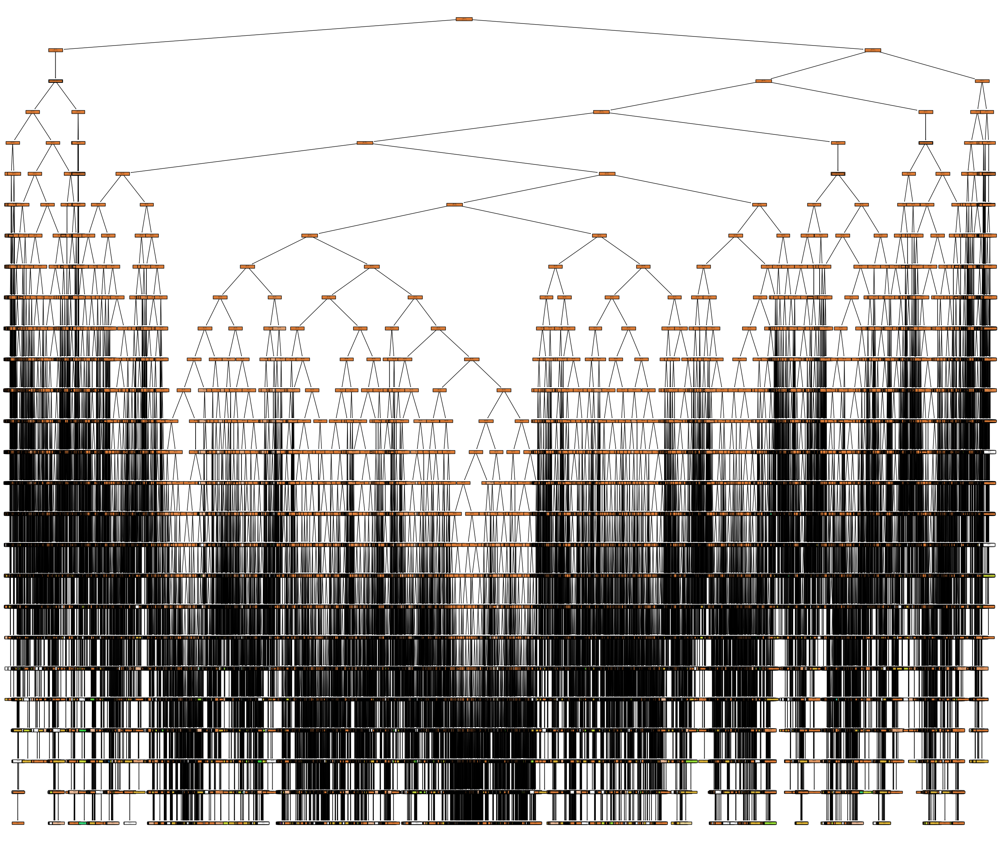

In [63]:
fig = plt.figure(figsize=(35,30))

tree.plot_tree(dtree, filled=True)
plt.show()

In [64]:
fig.savefig('/Users/andresmauriciotrianareina/Documents/Desarrollos/20_practice_machine_learning/10_excercise/Map_muse/Arbol de decision.png')

### Predict data

In [65]:
data = df[selected_features_fit]

list_predict = list(dtree.predict(data))

In [66]:
df['predict'] = list_predict

df.head()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,Covid/No covid,Conflicto FARC,cantidad,predict
0,0,91001,467,0,1984,1,0,0,0,0,0,1,0,0,0
1,0,91001,467,0,1984,1,0,0,0,0,1,1,0,0,0
2,0,91001,467,0,1984,1,0,0,0,1,0,1,0,0,0
3,0,91001,467,0,1984,1,0,0,0,1,1,1,0,0,0
4,0,91001,467,0,1984,1,0,0,1,0,0,1,0,0,0


In [67]:
del data
gc.collect()

105

In [68]:
df_2022 = df[(df.ano == 2021) & (df.mes > 11)]

df_2022['ano'].replace(
    to_replace=[2021],
    value=2023,
    inplace=True
)

df_2022.drop(columns=['cantidad','predict'], axis=1, inplace=True)


df_2023 = df[df['ano'] == 2021]

df_2023['ano'].replace(
    to_replace=[2021],
    value=2023,
    inplace=True
)

df_2023.drop(columns=['cantidad','predict'], axis=1, inplace=True)

/var/folders/x0/k5clg1_d5zvdfrj9s45515cr0000gn/T/ipykernel_4791/1919150023.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/x0/k5clg1_d5zvdfrj9s45515cr0000gn/T/ipykernel_4791/1919150023.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/x0/k5clg1_d5zvdfrj9s45515cr0000gn/T/ipykernel_4791/1919150023.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/x0/k5clg1_d5zvdfrj9s45515cr0000gn/T/ipykerne

In [69]:

data = df_2022[selected_features_fit]
list_predict = list(dtree.predict(data))
df_2022['Real/Predict'] = 'predict'
df_2022['Total'] = list_predict

data = df_2023[selected_features_fit]
list_predict = list(dtree.predict(data))
df_2023['Real/Predict'] = 'predict'
df_2023['Total'] = list_predict


df_2023 = pd.concat([df_2022, df_2023], ignore_index=True)

/var/folders/x0/k5clg1_d5zvdfrj9s45515cr0000gn/T/ipykernel_4791/1701377870.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/x0/k5clg1_d5zvdfrj9s45515cr0000gn/T/ipykernel_4791/1701377870.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/x0/k5clg1_d5zvdfrj9s45515cr0000gn/T/ipykernel_4791/1701377870.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [70]:
df = pd.melt(df, id_vars =['departamento','divipola','municipio','tipoarea','ano','mes','rangoedad','grupoetnico','condicion','estado','genero','Covid/No covid','Conflicto FARC'], value_vars =['cantidad','predict'],var_name ='Real/Predict', value_name ='Total')


In [71]:
df.head()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,Covid/No covid,Conflicto FARC,Real/Predict,Total
0,0,91001,467,0,1984,1,0,0,0,0,0,1,0,cantidad,0
1,0,91001,467,0,1984,1,0,0,0,0,1,1,0,cantidad,0
2,0,91001,467,0,1984,1,0,0,0,1,0,1,0,cantidad,0
3,0,91001,467,0,1984,1,0,0,0,1,1,1,0,cantidad,0
4,0,91001,467,0,1984,1,0,0,1,0,0,1,0,cantidad,0


In [72]:
df = pd.concat([df, df_2023], ignore_index=True)

In [73]:
#### inverse_transform

for col in selected_features_transform:
    df[col] = d[col].inverse_transform(df[col])

df.head()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,Covid/No covid,Conflicto FARC,Real/Predict,Total
0,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Herido,Hombre,No Covid,Conflicto armado con las FARC,cantidad,0
1,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Herido,Mujer,No Covid,Conflicto armado con las FARC,cantidad,0
2,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Muerto,Hombre,No Covid,Conflicto armado con las FARC,cantidad,0
3,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Muerto,Mujer,No Covid,Conflicto armado con las FARC,cantidad,0
4,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Fuerza pública,Herido,Hombre,No Covid,Conflicto armado con las FARC,cantidad,0


In [74]:
df.tail()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,Covid/No covid,Conflicto FARC,Real/Predict,Total
88216123,Vichada,99773,Cumaribo,Urbana,2023,12,Menor de 18 años,Ninguno,Civil,Muerto,Mujer,Covid,No implementación proceso de paz,predict,0
88216124,Vichada,99773,Cumaribo,Urbana,2023,12,Menor de 18 años,Ninguno,Fuerza pública,Herido,Hombre,Covid,No implementación proceso de paz,predict,0
88216125,Vichada,99773,Cumaribo,Urbana,2023,12,Menor de 18 años,Ninguno,Fuerza pública,Herido,Mujer,Covid,No implementación proceso de paz,predict,0
88216126,Vichada,99773,Cumaribo,Urbana,2023,12,Menor de 18 años,Ninguno,Fuerza pública,Muerto,Hombre,Covid,No implementación proceso de paz,predict,0
88216127,Vichada,99773,Cumaribo,Urbana,2023,12,Menor de 18 años,Ninguno,Fuerza pública,Muerto,Mujer,Covid,No implementación proceso de paz,predict,0


In [75]:
df['fecha'] = pd.to_datetime(df.ano.astype(str) + '/' + df.mes.astype(str) + '/01')
df['fecha'] = pd.to_datetime(df['fecha'], format='%d/%m/%Y')
df.head()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,Covid/No covid,Conflicto FARC,Real/Predict,Total,fecha
0,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Herido,Hombre,No Covid,Conflicto armado con las FARC,cantidad,0,1984-01-01
1,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Herido,Mujer,No Covid,Conflicto armado con las FARC,cantidad,0,1984-01-01
2,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Muerto,Hombre,No Covid,Conflicto armado con las FARC,cantidad,0,1984-01-01
3,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Civil,Muerto,Mujer,No Covid,Conflicto armado con las FARC,cantidad,0,1984-01-01
4,Amazonas,91001,Leticia,Rural,1984,1,Mayor de 18 años,Afrodescendiente,Fuerza pública,Herido,Hombre,No Covid,Conflicto armado con las FARC,cantidad,0,1984-01-01


In [76]:
Per_date =  df.groupby(['fecha','Real/Predict'], as_index=False ,dropna=False).sum()

In [77]:
fig = px.line(Per_date, x="fecha", y="Total", color='Real/Predict', title="Afectados MAP - MUSE")
fig.show()

In [78]:
fig.write_html("/Users/andresmauriciotrianareina/Documents/Desarrollos/20_practice_machine_learning/10_excercise/Map_muse/predict.html")

In [79]:
resumen = df[df['Total'] != 0].reset_index(drop=True)

In [80]:
resumen.head()

,departamento,divipola,municipio,tipoarea,ano,mes,rangoedad,grupoetnico,condicion,estado,genero,Covid/No covid,Conflicto FARC,Real/Predict,Total,fecha
0,Amazonas,91669,Puerto Santander (CD),Rural,2014,3,Mayor de 18 años,Ninguno,Civil,Herido,Mujer,No Covid,Conflicto armado con las FARC,cantidad,1,2014-03-01
1,Amazonas,91669,Puerto Santander (CD),Rural,2014,3,Mayor de 18 años,Ninguno,Fuerza pública,Herido,Hombre,No Covid,Conflicto armado con las FARC,cantidad,1,2014-03-01
2,Amazonas,91669,Puerto Santander (CD),Rural,2014,3,Mayor de 18 años,Ninguno,Fuerza pública,Muerto,Hombre,No Covid,Conflicto armado con las FARC,cantidad,2,2014-03-01
3,Antioquia,05001,Medellín,Rural,1999,3,Mayor de 18 años,Ninguno,Civil,Muerto,Hombre,No Covid,Conflicto armado con las FARC,cantidad,1,1999-03-01
4,Antioquia,05001,Medellín,Rural,1999,3,Menor de 18 años,Ninguno,Civil,Muerto,Hombre,No Covid,Conflicto armado con las FARC,cantidad,3,1999-03-01


In [81]:
resumen.to_excel('/Users/andresmauriciotrianareina/Documents/Desarrollos/20_practice_machine_learning/10_excercise/Map_muse/predict.xlsx')

: 